# Clustering, Aplastic anemia

In this notebook samples are merged together and UMAPs are generated based on RNA and latent space to compared which modality results in better clustering results. NK and B cell clusters are defined based on marker genes and proteins. 

### Samples:
- Aplastic anemia
- EG34, EG35 and EG36

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scanpy as sc
import umap
from pySankey import sankey
from ridgeplot import ridgeplot

import warnings

warnings.filterwarnings('ignore')

/research/users/tiinajt/miniconda3/envs/tiina-env2/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
#Retrieve the object

adata = ad.read_h5ad('/research/groups/sysgen/PROJECTS/scHEMAP/tiina_work/Easigenomics_final.h5ad')

In [3]:
adata

AnnData object with n_obs × n_vars = 148884 × 32738
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'SAMPLE_CODE', 'SUBTYPE', 'SAMPLE_TYPE', 'BATCH', 'DIAGNOSIS', 'TRAINING', 'HELDOUT_TEST', 'data_name'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_TotalVI', 'X_pca', 'X_umap', 'clr_protein_expression', 'dsb_protein_expression', 'protein_expression'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [4]:
adata_merged = adata[(adata.obs['DIAGNOSIS'] == "Aplastic anemia")]   

In [5]:
adata_merged.obs['SAMPLE_CODE'].unique().tolist()

['EG34', 'EG35', 'EG36']

In [6]:
#surface protein expression, CLR selected
prot=adata_merged.obsm['dsb_protein_expression']

In [7]:
#adding protein information to obs

a = adata_merged.obs
b = prot

adata1=pd.concat([a, b], axis=1)
adata_merged.obs=adata1

In [8]:
adata_merged

AnnData object with n_obs × n_vars = 6954 × 32738
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'SAMPLE_CODE', 'SUBTYPE', 'SAMPLE_TYPE', 'BATCH', 'DIAGNOSIS', 'TRAINING', 'HELDOUT_TEST', 'data_name', 'CD19.1', 'CD10', 'CD20', 'CD3', 'CD2.1', 'CD11b', 'HLADR', 'CD38.1', 'CD11c', 'CD7.1', 'CD45', 'CD33.1', 'CD81.1', 'CD73', 'CD123', 'CD14.1', 'CD45RA', 'CD45RO', 'CD4.1', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5.1', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44.1', 'CD58.1', 'CD66ace', 'CD13', 'CD34.1'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_TotalVI', 'X_pca', 'X_umap', 'clr_protein_expression', 'dsb_protein_expression', 'protein_expression'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [9]:
#creating 2 objects
adata_prot_dsb = adata_merged.copy()
adata_prot_clr = adata_merged.copy()

## Clustering based on latent space

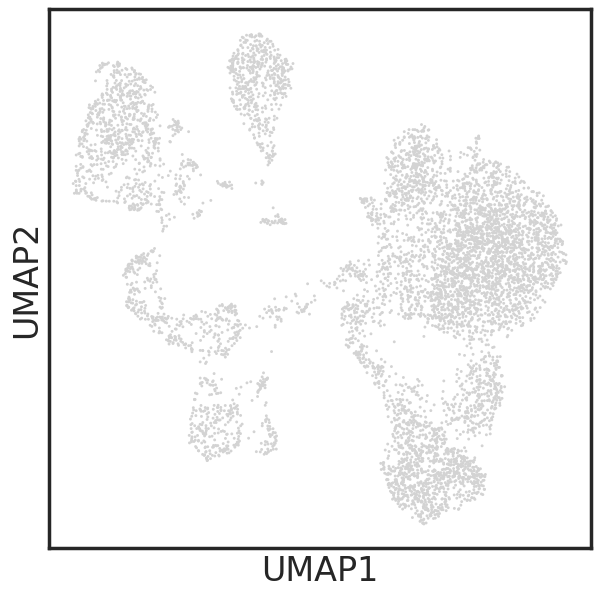

In [10]:
#Based on latent space

sns.set(style='white', context = "poster", rc={'figure.figsize':(7,7)})

#Calculating neighbors for UMAPs

sc.pp.neighbors(adata_merged, use_rep = 'X_TotalVI')    

sc.tl.umap(adata_merged)

sc.pl.umap(adata_merged)

In [11]:
nk_markers = ['FGFBP2',
 'FCGR3A',
 'S1PR5',
 'KLRC1',
 'KLRC2',
 'KLRC3',
 'KLRD1',
 'GNLY',
 'GZMB',
 'CX3CR1',
 'GPR56',
 'PRF1',
 'KLRB1',
 'SPON2',
 'NKG7',
 'TTC38',
 'FCRL6',
 'LILRB1',
 'PLAC8',
 'MBP',
 'NCAM1',
 'GZMK',
 'GZMA',
 'KLRB1',
 'KLRC2',
 'GZMH',
 'LAG3',
 'B2M',
 'HLA-DRA',
 'OAS3',
 'MX1',
 'IRF7',
 'MX2',
 'IRF9',
 'OAS1',
 'OAS2',
 'EIF2AK2',
 'TNFRSF18',
 'TNFRSF9',
 'TNFRSF4',
 'CRTAM',
 'ENTPD1',
 'HAVCR2',
 'TIGIT',
 'TNFSF10',
 'BCL2L11',
 'CCL3',
 'CCL4',
 'TNF',
 'IFNG',
 'CD69']

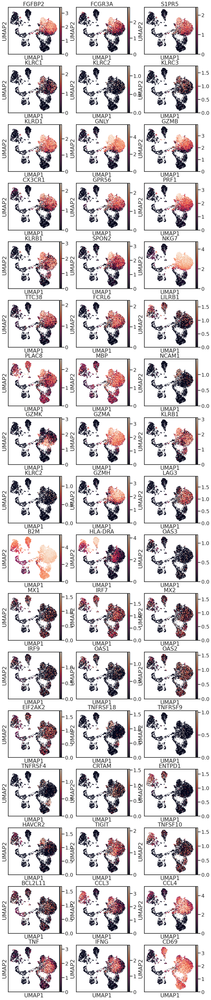

In [12]:
sns.set(style='white', context='poster', rc={'figure.figsize':(4,4)})

sc.pl.umap(adata_merged, color=nk_markers, ncols =3, vmax="p99")

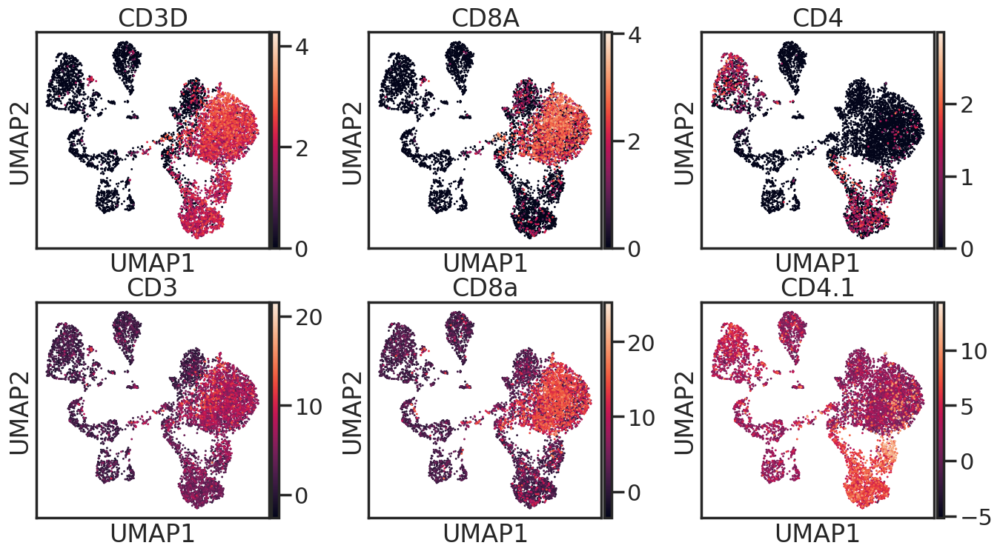

In [13]:
sns.set(style='white', context='poster', rc={'figure.figsize':(4,4)})

#T cell markers

sc.pl.umap(adata_merged,  wspace =0.3, color = ['CD3D', 'CD8A', 'CD4','CD3', 'CD8a', 'CD4.1'], ncols=3)

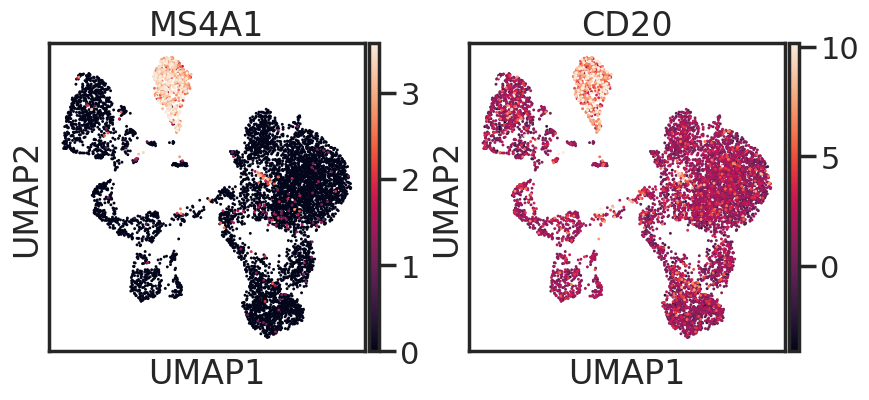

In [14]:
#B cell markers

sc.pl.umap(adata_merged, color= ['MS4A1', 'CD20'], ncols =3, vmax="p99")

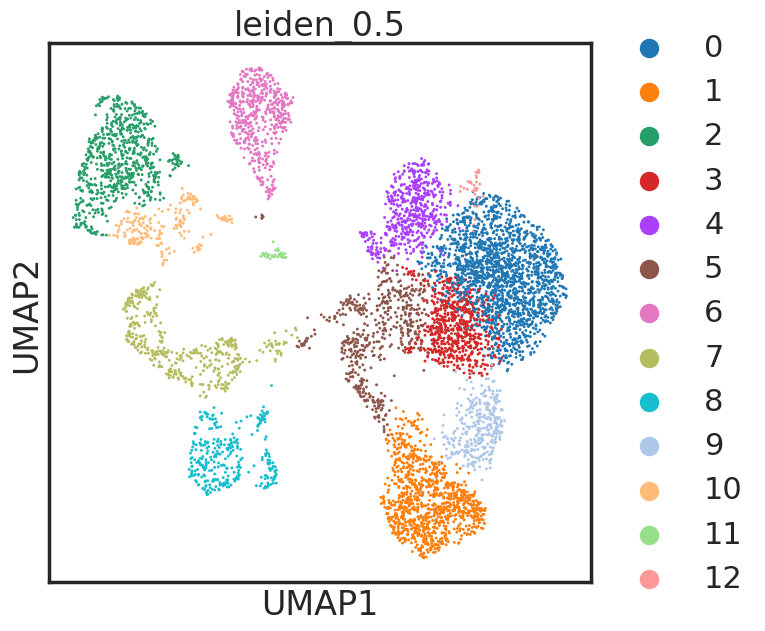

In [15]:
sns.set(style='white', context = "poster", rc={'figure.figsize':(7,7)})

sc.tl.leiden(adata_merged, resolution = 0.5, key_added = "leiden_0.5")

sc.pl.umap(adata_merged, color=['leiden_0.5'], ncols =3)

- Based on marker genes + proteins, cluster 4 represents NK cells

In [53]:
adata_nk = adata_merged[adata_merged.obs['leiden_0.5'] == "4"]

In [66]:
#All samples

clr = adata_nk.obsm['clr_protein_expression']
dsb = adata_nk.obsm['dsb_protein_expression']



In [67]:
clr.columns

Index(['CD11b', 'CD45RO', 'HLADR', 'CD19', 'CD197', 'CD20', 'CD45RA',
       'CD66ace', 'CD2', 'CD64', 'CD81', 'CD3', 'CD8', 'CD127', 'CD7', 'CD117',
       'CD10', 'CD33', 'CD44', 'CD15', 'CD14', 'CD45', 'CD4', 'CD34', 'CD56',
       'CD24', 'CD123', 'CD11c', 'CD73', 'CD38', 'CD13', 'CD5', 'CD58'],
      dtype='object')

In [68]:
dsb.columns

Index(['CD19.1', 'CD10', 'CD20', 'CD3', 'CD2.1', 'CD11b', 'HLADR', 'CD38.1',
       'CD11c', 'CD7.1', 'CD45', 'CD33.1', 'CD81.1', 'CD73', 'CD123', 'CD14.1',
       'CD45RA', 'CD45RO', 'CD4.1', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5.1',
       'CD15', 'CD64', 'CD117', 'CD24', 'CD44.1', 'CD58.1', 'CD66ace', 'CD13',
       'CD34.1'],
      dtype='object')

In [69]:
#Correct DSB column names 
dsb=dsb.rename(columns={'CD8a': 'CD8', 'CD19.1': 'CD19', 'CD2.1': 'CD2', 'CD64.1': 'CD64','CD81.1': 'CD81', 'CD7.1': 'CD7',
       'CD33.1': 'CD33', 'CD44.1': 'CD44', 'CD14.1': 'CD14', 'CD4.1': 'CD4', 'CD34.1': 'CD34', 'CD38.1': 'CD38', 'CD5.1': 'CD5', 'CD58.1': 'CD58'})

In [70]:
dsb.shape

(530, 33)

In [71]:
clr.shape

(530, 33)

In [72]:
dsb['CD8']

EG34_L17_CATATTCGTGACCAAG-1    2.999521
EG34_L17_GTCACAAAGTTCGCAT-1    2.019690
EG34_L17_GTTCGGGCACAACGCC-1    0.304081
EG34_L17_TACTCGCGTGAAATCA-1    0.581506
EG35_L17_AAACGGGGTTGATTGC-1    0.846597
                                 ...   
EG36_L18_TTGTAGGAGGTTACCT-1    7.837714
EG36_L18_TTTGCGCAGGCGACAT-1    1.804278
EG36_L18_TTTGGTTGTGATGATA-1    0.177421
EG36_L18_TTTGGTTTCACGCGGT-1    2.300440
EG36_L18_TTTGTCAAGTCGTTTG-1    0.850452
Name: CD8, Length: 530, dtype: float64

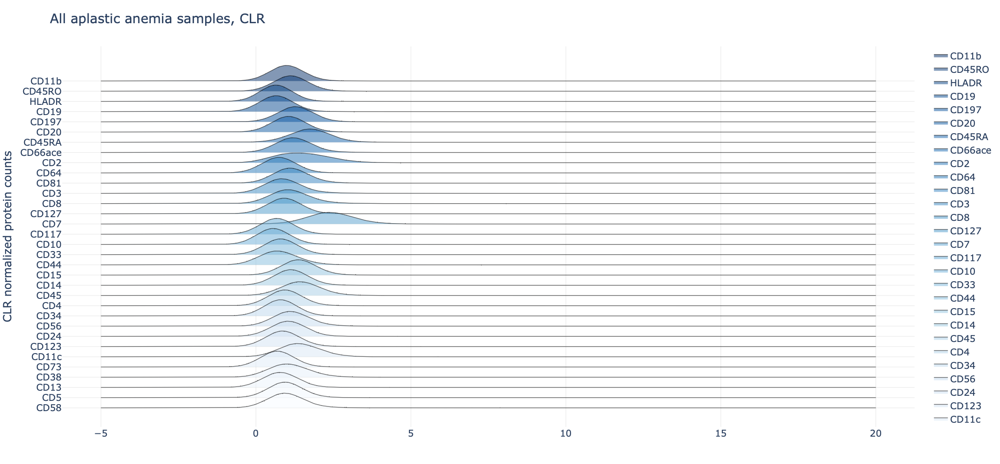

In [89]:
#Easigenomics, NK markers, selected sample

column_names = clr.columns
df = clr[column_names]

fig = ridgeplot(
    samples=df.values.T,
    bandwidth=0.5,
    kde_points=np.linspace(-5, 20, 500),
    colorscale="Blues",
    colormode="index",
    coloralpha=0.5,
    labels=column_names,
    spacing=5 / 8,
)

fig.update_layout(
    title="All aplastic anemia samples, CLR",
    height=1000,
    width=600,
    plot_bgcolor="rgba(255, 255, 255, 0.0)",
    xaxis_gridcolor="rgba(0, 0, 0, 0.1)",
    yaxis_gridcolor="rgba(0, 0, 0, 0.1)",
    yaxis_title="CLR normalized protein counts",
    font=dict(size=20)
)


fig.show()


In [76]:
columnsTitles = clr.columns

dsb = dsb.reindex(columns=columnsTitles)

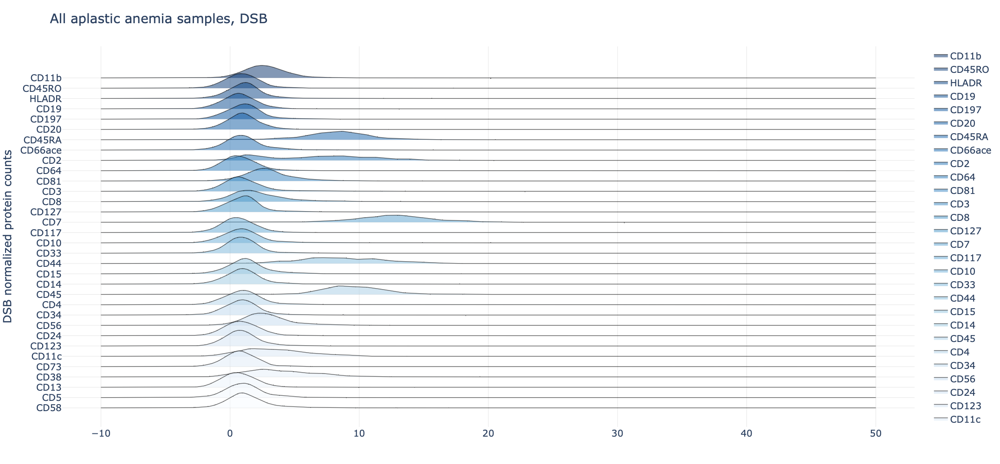

In [90]:
column_names = dsb.columns
df = dsb[column_names]

fig = ridgeplot(
    samples=df.values.T,
    bandwidth=0.5,
    kde_points=np.linspace(-10, 50, 500),
    colorscale="Blues",
    colormode="index",
    coloralpha=0.5,
    labels=column_names,
    spacing=5 / 8,
)

fig.update_layout(
    title="All aplastic anemia samples, DSB",
    height=1000,
    width=600,
    plot_bgcolor="rgba(255, 255, 255, 0.0)",
    xaxis_gridcolor="rgba(0, 0, 0, 0.1)",
    yaxis_gridcolor="rgba(0, 0, 0, 0.1)",
    yaxis_title="DSB normalized protein counts",
    font=dict(size=20),
)
fig.show()